# Burnt area mapping using Sentinel-2 data

* **Products used:** 
[s2_l2a](https://explorer.digitalearth.africa/s2_l2a)

## Background

### Normalized Burn Ratio

The Normalized Burn Ratio (NBR) is an index that uses the differences in the way healthy green vegetation and burnt vegetation reflect light to find burnt area. 
It is calculated using the following Sentinel-2 bands: Near Infrared/Band 8 and Shortwave Infrared/Band 12. The equation is defined below: 

\begin{equation}
\text{NBR} = \frac{(\text{NIR} - \text{SWIR})}{(\text{NIR} + \text{SWIR})}
\end{equation}

NBR returns values between -1 and 1. 
**Healthy green vegetation will have a high NBR value while burnt vegetation will have a low value**. 
Areas of dry, brown vegetation or bare soil will also return lower NBR values than green vegetation. 

### Delta Normalized Burn Ratio

Change in Normalized Burn Ratio - also called Delta Normalized Burn Ratio (dNBR) - is calculated by subtracting the post-fire NBR value from the baseline NBR value as defined in this equation:

\begin{equation}
\text{dNBR} = \text{NBR}_{\text{baseline}} - \text{NBR}_{\text{post fire}}
\end{equation}

The dNBR value can be more useful than the NBR alone to determine what is burnt as it shows change from the baseline state. 
**A burnt area will have a positive dNBR value** while an unburnt area will have a negative dNBR value or a value close to zero.

dNBR can also be used to describe burn severity (although this notebook does not look at burn severity). 
A higher severity fire will burn more vegetation, resulting in a higher dNBR. More information on NBR, dNBR and using it to measure burn severity can be found [on the UN-SPIDER knowledge portal](http://un-spider.org/advisory-support/recommended-practices/recommended-practice-burn-severity/in-detail/normalized-burn-ratio).

### Defining Burnt From Unburnt Areas using the dNBR

[Rahman et al. 2018](https://doi.org/10.1109/IGARSS.2018.8518449) found a dNBR threshold value of +0.1 appropriate for differentiating burnt from unburnt areas when using Sentinel-2. 
However, some exploration with different threshold levels may be needed to get a good result in areas with different vegetation types. 

Using +0.1 as a threshold here may result in many false positives being picked up in the unburnt urban and forest areas where vegetation drying has occurred prior to the fire. 
If so, using a much more conservative threshold here of +0.3 produces a better result. 
Keep in mind the limitations of remote sensing and that in an ideal situation ground truth data collected in the location of interest would be used to assist in selecting a threshold.

Some care should also be taken when interpreting results as a number of possible false positives can return a positive dNBR result:

* A lot of smoke in the post burn image can interfere with the dNBR value
* Areas that have been cleared of vegetation by some other means (logging, harvesting, and landslides) towards the end of the baseline period may incorrectly show up as burnt
* Drying out of bright green vegetation such as grasses. 
If a fire event has been preceded by a rapid drying out of vegetation this can result in a low positive dNBR value in areas that have not burnt.

### Burnt Area Index 

The Burnt Area Index (BAI) is a spectral index that emphasizes the charcoal signal in post-fire images to find the burnt area [(Chuvieco et al. 2002)](https://doi.org/10.1080/01431160210153129). 
It is calculated using the following Sentinel-2 bands: Red edge/Band 6 and NIR/Band 8A. The equation is defined below: 

\begin{equation}
\text{BAI} = \frac{1}{\left ( 0.1 - \text{Red}_\text{edge} \right )^2 + \left ( 0.06 - \text{NIR} \right )^2}
\end{equation}

### Delta Burnt Area Index 

Change in the Burnt Area Index- also called Delta  Burnt Area Index (dBAI) - is calculated by subtracting the post-fire BAI value from the baseline BAI value as defined in this equation:

\begin{equation}
\text{dBAI} = \text{BAI}_{\text{baseline}} - \text{BAI}_{\text{post fire}}
\end{equation}

### Defining Burnt From Unburnt Areas using the dBAI
For the default area of interest in this notebook, a dBAI threshold value of -0.00000005 is appropriate for differentiating burnt from unburnt areas when using Sentinel-2. 

### Burnt Area Index for Sentinel-2 

The Burnt Area Index for Sentinel 2 (BAIS2) uses a band ratio in the red-edge spectral domain, which aims to describe vegetation properties, combined with a band ratio to detect the radiometric response of the SWIR spectral domain, largely recognized to be efficient in the determination of burned areas [(Filipponi, F., 2018)](https://doi.org/10.3390/ecrs-2-05177). It is calculated using the folowing equation: 

\begin{equation}
\text{BAIS2} = \left ( 1 - \sqrt{\frac{\text{B06} * \text{B07} * \text{B8A}}{\text{B4}}}  \right ) * \left ( \frac{\text{B12} - \text{B8A}}{\sqrt{\text{B12} + \text{B8A}}} + 1 \right )
\end{equation}

### Delta Burnt Area Index for Sentinel-2 

Change in the Burnt Area Index for Sentinel 2 - also called Delta  Burnt Area Index for Sentinel 2 (dBAIS2) is calculated by subtracting the post-fire BAIS2 value from the baseline BAIS2 value as defined in this equation:

\begin{equation}
\text{dBAIS2} = \text{BAIS2}_{\text{baseline}} - \text{BAIS2}_{\text{post fire}}
\end{equation}

### Defining Burnt From Unburnt Areas using the dBAIS2
For the default area of interest in this notebook, a dBAIS2 threshold value of +20000 is appropriate for differentiating burnt from unburnt areas when using Sentinel-2. 

## Description

This notebook calculates the change in Burnt Area Index, Burnt Area Index for Sentinel 2  and Normalized Burn Ratio between a baseline composite image of the pre-fire condition of a selected area and a post-fire event image, in order to find burnt area extent.
 
The user can change the location over which this notebook is run and specify a different date between which pre and post fire condition will be compared. 
The length of time over which the baseline composite image will be generated can be specified as 3, 6 or 12 months. 

The notebook contains the following steps:

1.  Select a location for the analysis.
2.  Define the pre-fire, fire event and post-fire dates and the length of the baseline and post-fire periods.
3.  Load all baseline data.
4.  Generate Normalized Burn Ratio for the baseline period.
5.  Generate Burnt Area Index for the baseline period.
7.  Load post-fire data.
8.  Generate Normalized Burn Ratio for the post fire image.
9.  Generate Burnt Area Index for the  post fire image.
11. Calculate Delta Normalized Burn Ratio.
12. Calculate Delta Burnt Area Index.
13. Calculate Delta Burnt Area Index for Sentinel 2.
14. Examine MODIS and VIIRS hotspot data for the area of interest. 
15. Apply threshold to Delta Normalized Burn Ratio.
16. Apply threshold to Delta Burnt Area Index.
18. Calculate the burnt area for each index.
19. Export results as a GeoTIFF.

***

## Getting started

To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell. 

### Load packages
Import Python packages that are used for the analysis.

In [1]:
import datacube
from datetime import datetime
from datetime import timedelta
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from zipfile import ZipFile
import geopandas as gpd
from pyproj import Proj, transform
from datacube.utils.cog import write_cog

from deafrica_tools.datahandling import load_ard, mostcommon_crs
from deafrica_tools.plotting import rgb, display_map
from deafrica_tools.bandindices import calculate_indices

### Connect to the datacube

Connect to the datacube so we can access DEA data.
The `app` parameter is a unique name for the analysis which is based on the notebook file name.

In [2]:
dc = datacube.Datacube(app="burnt_area_mapping_abalak")

### Analysis parameters

The following cell sets the parameters, which define the area of interest and the length of time to conduct the analysis over.
The parameters are

* `lat`: The central latitude to analyse (e.g. `15.45`).
* `lon`: The central longitude to analyse (e.g. `6.283333`).
* `buffer`: The number of square degrees to load around the central latitude and longitude.
For reasonable loading times, set this as `0.1` or lower.
* `baseline_length`: To understand the effect of the fire, the analysis produces a baseline image, which is compiled from all available data over the `baseline_length` time period prior to the `fire_date`. This can be set as `'3 months'`, `'6 months'` or `'12 months'`.

**If running the notebook for the first time**, keep the default settings below.
This will demonstrate how the analysis works and provide meaningful results.
The example covers Abalak region (Niger) which has experienced bush fire from September to October 2021.

**To run the notebook for a different area**, make sure Sentinel-2 data is available for the chosen area using the [DEAfrica Explorer](https://explorer.digitalearth.africa).
Use the drop-down menu to check both Sentinel-2A (`s2a_msil2a`) and Sentinel-2B (`s2b_msil2a`). 

### Select location

The selected latitude and longitude will be displayed as a red box on the map below the next cell. 
This map can be used to find coordinates of other places, simply scroll and click on any point on the map to display the latitude and longitude of that location.

In [3]:
# Define an area name to be used in saved file names.
area_name = "Abalak"

# Define the area of interest.
lat = 15.45
lon = 6.283333
buffer = 0.1

# Compute the bounding box for the study area.
lat_range = (lat - buffer, lat + buffer)
lon_range = (lon - buffer, lon + buffer)

# Define the product to used.
product = "s2_l2a"

### View the selected location
The next cell will display the selected area on an interactive map.
Feel free to zoom in and out to get a better understanding of the area you'll be analysing.
Clicking on any point of the map will reveal the latitude and longitude coordinates of that point.

In [4]:
display_map(x=lon_range, y=lat_range)

## Define the Pre-fire, Fire event and Post-fire Dates and the Length of the Baseline and Post-fire Periods

The first step in the analysis is to define the start and end dates for the baseline period (the pre-fire period),  the the fire event period and the post fire period.

### Load all Sentinel 2 data for the bush fire season 

In [5]:
fire_period = load_ard(
    dc=dc,
    products=[product],
    measurements=["blue", "green", "red"],
    y=lat_range,
    x=lon_range,
    time=("2021-09-01", "2021-10-31"),
    resolution=(-20, 20),
    output_crs="EPSG:6933",
    group_by="solar_day",
)

print(fire_period)

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Applying pixel quality/cloud mask
Loading 12 time steps
<xarray.Dataset>
Dimensions:      (time: 12, y: 1232, x: 966)
Coordinates:
  * time         (time) datetime64[ns] 2021-09-02T10:16:25 ... 2021-10-27T10:...
  * y            (y) float64 1.96e+06 1.96e+06 1.96e+06 ... 1.936e+06 1.936e+06
  * x            (x) float64 5.966e+05 5.966e+05 ... 6.159e+05 6.159e+05
    spatial_ref  int32 6933
Data variables:
    blue         (time, y, x) float32 nan nan nan ... 1.188e+03 1.236e+03
    green        (time, y, x) float32 nan nan nan ... 1.75e+03 1.786e+03
    red          (time, y, x) float32 nan nan nan ... 2.636e+03 2.642e+03
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref


### View the Sentinel 2 data available for the bush fire season

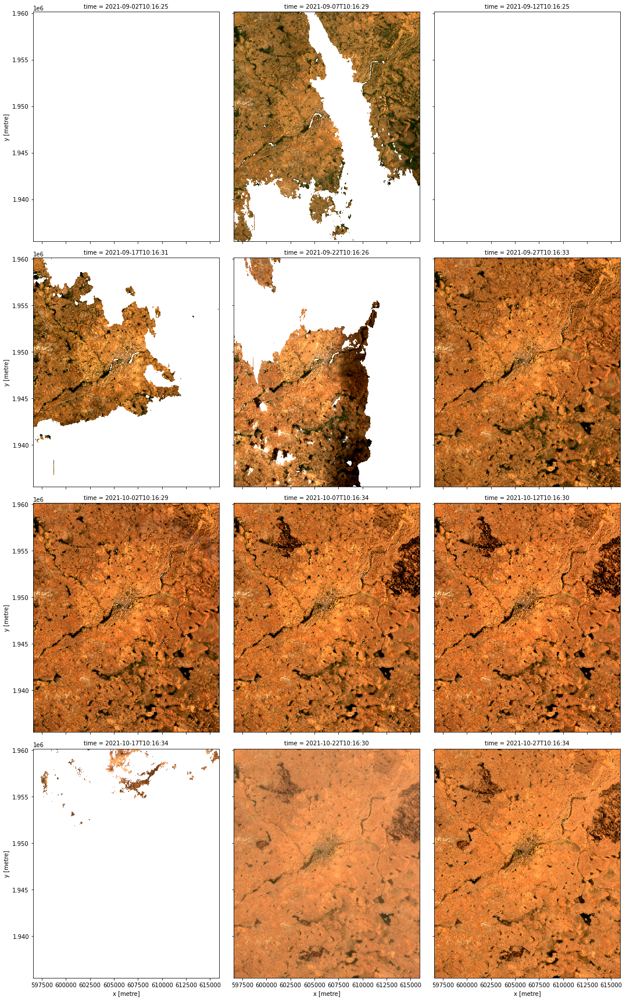

In [6]:
rgb(
    fire_period,
    index=list(range(len(fire_period.time))),
    bands=["red", "green", "blue"],
    col_wrap=3,
)

From the RGB images above, investigate if you can identify the smoke indicating bush fires and burn scars. 

### Define the Pre-fire, Fire event and Post-fire Dates and the Length of the Baseline and Post-fire Periods

Delta Burned Area Index, Delta Burned Area Index for Sentinel 2 and Delta Normalized Burn Ratio produce the best results when using a post-fire image that was collected before much re-growth has occured. 
However, images collected while the fire is still active can be obscured by smoke and not show the full burn extent. 
As a result some adjustment of the fire event date entered may be needed to get the best result.

The length of the baseline period can be automatically set to `3, 6 or 12 months`

In [7]:
# Fire event start date.
fire_start_date = "2021-09-02"

# Fire event end date.
fire_end_date = "2021-10-02"

# Length of baseline period.
baseline_length = "3 months"

After setting the `fire_start_date`, `fire_end_date` and `baseline_length`, the code below automatically calculates start and end dates for the pre-fire and post-fire periods.
The post-fire period is defined as 30 days after the `fire_end_date`.

In [8]:
# Define dates for loading data.
if baseline_length == "12 months":
    time_step = timedelta(days=365)
if baseline_length == "6 months":
    time_step = timedelta(days=182.5)
if baseline_length == "3 months":
    time_step = timedelta(days=91)

# Calculate the start and end date for baseline data load.
start_date_pre = datetime.strftime(
    ((datetime.strptime(fire_start_date, "%Y-%m-%d")) - time_step), "%Y-%m-%d"
)
end_date_pre = datetime.strftime(
    ((datetime.strptime(fire_start_date, "%Y-%m-%d")) - timedelta(days=1)), "%Y-%m-%d"
)

# Calculate end date for post fire data load.
start_date_post = datetime.strftime(
    ((datetime.strptime(fire_end_date, "%Y-%m-%d")) + timedelta(days=1)), "%Y-%m-%d"
)
end_date_post = datetime.strftime(
    ((datetime.strptime(fire_end_date, "%Y-%m-%d")) + timedelta(days=30)), "%Y-%m-%d"
)

In [9]:
# Print dates.
print("start_date_pre:  " + start_date_pre)
print("end_date_pre:    " + end_date_pre)

print("fire_start_date: " + fire_start_date)
print("fire_end_date:   " + fire_end_date)

print("start_date_post: " + start_date_post)
print("end_date_post:   " + end_date_post)

start_date_pre:  2021-06-03
end_date_pre:    2021-09-01
fire_start_date: 2021-09-02
fire_end_date:   2021-10-02
start_date_post: 2021-10-03
end_date_post:   2021-11-01


## Load all baseline data

The second step in the analysis is load Sentinel-2 data for the pre-fire period, as defined by the baseline length set above.
This uses the pre-defined [load_ard](../Frequently_used_code/Using_load_ard.ipynb) utility function.
This function will automatically mask any clouds in the dataset, and only return images where more than 60% of the pixels were classified as clear (set using `min_gooddata=0.6`).
When working with Sentinel-2, the function will also combine and sort images from both Sentinel-2A and Sentinel-2B.

> **Note**: This analysis performs calculations that use the on-ground area of each pixel. For this type of analysis, it is recommended that all data be reprojected to an equal area projection, such as [EPSG:6933](https://epsg.io/6933).
This is done below by setting the `output_crs` parameter to `"EPSG:6933"`.

**Please be patient**.
The data may take a few minutes to load and progress will be indicated by text output.
The load is complete when the cell status goes from `[*]` to `[number]`.

In [10]:
# Define load parameters.
resolution = (-10, 10)
measurements = [
    "blue",
    "green",
    "red",
    "red_edge_2",
    "red_edge_3",
    "nir",
    "nir_narrow",
    "swir_2",
]
min_gooddata = 0.6

# Since this analysis calculates pixel areas,
# set the output projection to equal area projection EPSG:6933.
output_crs = "EPSG:6933"

In [11]:
# Create a reusable query.
query = {
    "x": lon_range,
    "y": lat_range,
    "resolution": resolution,
    "measurements": measurements,
}

# Load all data in baseline period avalible from ARD data.
baseline_ard = load_ard(
    dc=dc,
    products=[product],
    time=(start_date_pre, end_date_pre),
    min_gooddata=min_gooddata,
    output_crs=output_crs,
    group_by="solar_day",
    **query
)

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Counting good quality pixels for each time step
Filtering to 10 out of 18 time steps with at least 60.0% good quality pixels
Applying pixel quality/cloud mask
Loading 10 time steps


**Once the load is complete**, examine the data by printing it in the next cell.
The `Dimensions` argument revels the number of time steps in the data set, as well as the number of pixels in the `x` (longitude) and `y` (latitude) dimensions.

In [12]:
print(baseline_ard)

<xarray.Dataset>
Dimensions:      (time: 10, y: 2462, x: 1931)
Coordinates:
  * time         (time) datetime64[ns] 2021-06-09T10:16:30 ... 2021-08-28T10:...
  * y            (y) float64 1.96e+06 1.96e+06 1.96e+06 ... 1.936e+06 1.936e+06
  * x            (x) float64 5.966e+05 5.966e+05 ... 6.159e+05 6.159e+05
    spatial_ref  int32 6933
Data variables:
    blue         (time, y, x) float32 1.532e+03 1.514e+03 ... 889.0 944.0
    green        (time, y, x) float32 2.242e+03 2.234e+03 ... 1.504e+03 1.51e+03
    red          (time, y, x) float32 3.212e+03 3.16e+03 ... 1.548e+03 1.592e+03
    red_edge_2   (time, y, x) float32 3.669e+03 3.718e+03 ... 4.059e+03
    red_edge_3   (time, y, x) float32 3.865e+03 3.928e+03 ... 4.269e+03 4.41e+03
    nir          (time, y, x) float32 3.908e+03 3.868e+03 ... 4.188e+03
    nir_narrow   (time, y, x) float32 4.118e+03 4.17e+03 ... 4.529e+03 4.646e+03
    swir_2       (time, y, x) float32 4.939e+03 4.899e+03 ... 3.037e+03
Attributes:
    crs:           E

## Generate Normalized Burn Ratio for the baseline period

We now calculate the NBR values for the baseline period using the [calculate_indices](../Frequently_used_code/Calculating_band_indices.ipynb) function, imported from [deafrica_bandindices.py](../Scripts/deafrica_bandindices.py).
Here, we use `collection='s2'` since we're working with Sentinel-2 data.
When using `calculate_indices` the index is added directly to the `baseline_ard` dataset.

In [13]:
# Calculate NBR for the baseline images.
baseline_ard = calculate_indices(baseline_ard, index="NBR", collection="s2", drop=False)

# Compute median using all observations in the dataset along the time axis.
baseline_image = baseline_ard.median(dim="time")

# Select NBR.
baseline_NBR = baseline_image.NBR

### Visualise NBR

To see how NBR corresponds with a standard image, we can plot the baseline NBR data side-by-side with an RGB plot of the study area:

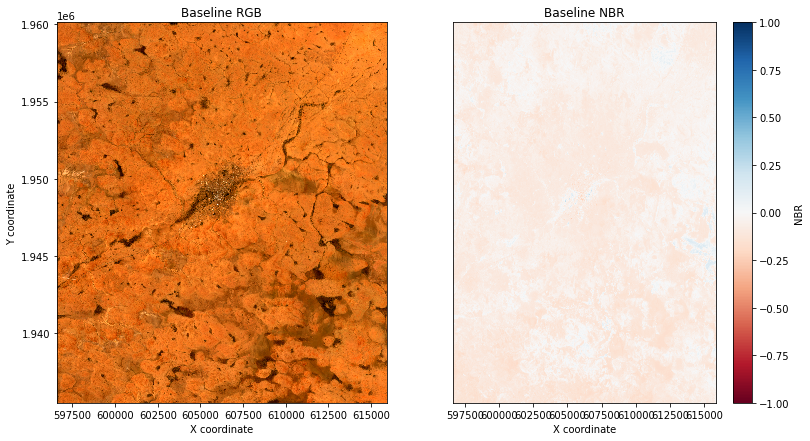

In [14]:
# Set up subplots.
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise baseline image as true colour image.
rgb(baseline_image, bands=["red", "green", "blue"], ax=ax1)
ax1.set_title("Baseline RGB")
ax1.set_xlabel("X coordinate")
ax1.set_ylabel("Y coordinate")

# Visualise baseline image as NBR image.
baseline_NBR.plot(cmap="RdBu", vmin=-1, vmax=1, ax=ax2)
ax2.set_title("Baseline NBR")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate")

plt.show()

## Generate Burnt Area Index (BAI) for the  baseline period

In [15]:
# Calculate BAI for the baseline images.
baseline_ard["BAI"] = 1 / (
    (0.1 - baseline_ard.red_edge_2) ** 2 + (0.06 - baseline_ard.nir_narrow) ** 2
)

# Compute median using all observations in the dataset along the time axis.
baseline_image = baseline_ard.median(dim="time")

# Select BAI.
baseline_BAI = baseline_image.BAI

### Visualise BAI
To see how BAI corresponds with a standard image, we can plot the baseline BAI data side-by-side with an RGB plot of the study area:

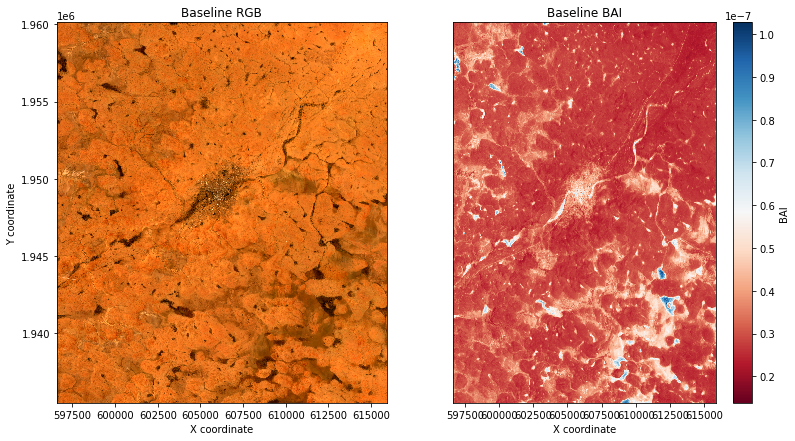

In [16]:
# Set up subplots.
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise baseline image as true colour image.
rgb(baseline_image, bands=["red", "green", "blue"], ax=ax1)
ax1.set_title("Baseline RGB")
ax1.set_xlabel("X coordinate")
ax1.set_ylabel("Y coordinate")

# Visualise baseline image as BAI image.
baseline_BAI.plot(cmap="RdBu", ax=ax2)
ax2.set_title("Baseline BAI")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate")

plt.show()

## Generate Burnt Area Index for Sentinel 2 (BAIS2) for the baseline period

In [17]:
# Calculate BAIS2 for the baseline images.
baseline_ard["BAIS2"] = 1 - (
    (baseline_ard.red_edge_2 * baseline_ard.red_edge_3 * baseline_ard.nir_narrow)
    / baseline_ard.red
) ** 0.5 * (
    (
        (baseline_ard.swir_2 - baseline_ard.nir_narrow)
        / (baseline_ard.swir_2 + baseline_ard.nir_narrow) ** 0.5
    )
    + 1
)

# Compute median using all observations in the dataset along the time axis.
baseline_image = baseline_ard.median(dim="time")

# Select BAIS2.
baseline_BAIS2 = baseline_image.BAIS2

### Visualise BAIS2
To see how BAIS2 corresponds with a standard image, we can plot the baseline BAIS2 data side-by-side with an RGB plot of the study area:

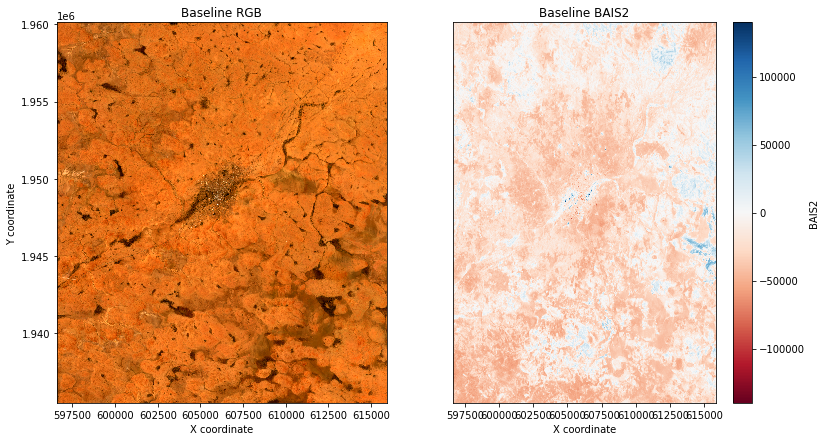

In [18]:
# Set up subplots.
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise baseline image as true colour image.
rgb(baseline_image, bands=["red", "green", "blue"], ax=ax1)
ax1.set_title("Baseline RGB")
ax1.set_xlabel("X coordinate")
ax1.set_ylabel("Y coordinate")

# Visualise baseline image as NBR image.
baseline_BAIS2.plot(cmap="RdBu", ax=ax2)
ax2.set_title("Baseline BAIS2")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate")

plt.show()

## Load post-fire data

We now load images that occur up to 30 days after the fire.
Since we previously defined the area of interest and measurements with the `query` parameter, we can reuse this to simplify the load command, noting that we only need to change the `time` variable to use the post-fire dates calculated earlier.

**Please be patient**.
The data may take a few minutes to load and progress will be indicated by text output.
The load is complete when the cell status goes from `[*]` to `[number]`.

In [19]:
# Load post-fire data from Sentinel-2A and 2B.
post_col = load_ard(
    dc=dc,
    products=[product],
    time=(start_date_post, end_date_post),
    min_gooddata=min_gooddata,
    output_crs=output_crs,
    group_by="solar_day",
    **query
)

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Counting good quality pixels for each time step
Filtering to 5 out of 6 time steps with at least 60.0% good quality pixels
Applying pixel quality/cloud mask
Loading 5 time steps


## Generate Normalized Burn Ratio for post fire period

In [20]:
# Calculate NBR on all post-fire images.
post_combined = calculate_indices(post_col, index="NBR", collection="s2", drop=False)

# Calculate the median post-fire image.
post_image = post_combined.median(dim="time")

# Select NBR.
post_NBR = post_image.NBR

### Visualise NBR

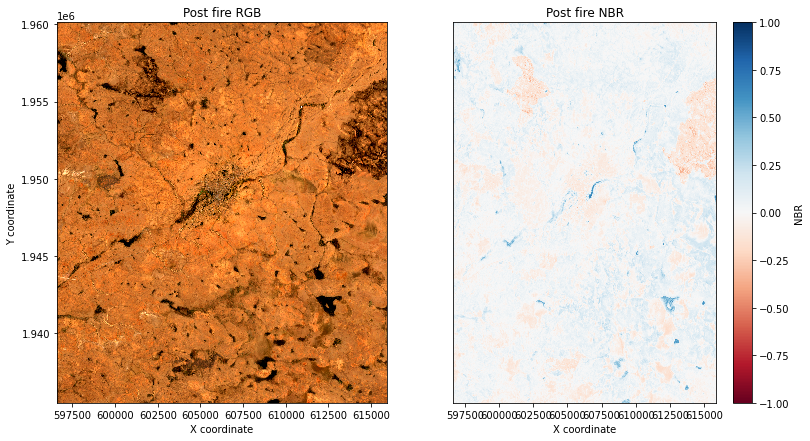

In [21]:
# Set up subplots.
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise the post-fire image as true colour image.
rgb(post_image, bands=["red", "green", "blue"], ax=ax1)
ax1.set_title("Post fire RGB")
ax1.set_xlabel("X coordinate")
ax1.set_ylabel("Y coordinate")

# Visualise post-fire image as NBR image.
post_NBR.plot(cmap="RdBu", vmin=-1, vmax=1, ax=ax2)
ax2.set_title("Post fire NBR")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate")

plt.show()

## Generate Burnt Area Index for the post fire period

In [22]:
# Calculate BAI on all post-fire images.
post_combined["BAI"] = 1 / (
    (0.1 - post_combined.red_edge_2) ** 2 + (0.06 - post_combined.nir_narrow) ** 2
)

# Calculate the median post-fire image.
post_image = post_combined.median(dim="time")

# Select BAI.
post_BAI = post_image.BAI

### Visualize BAI

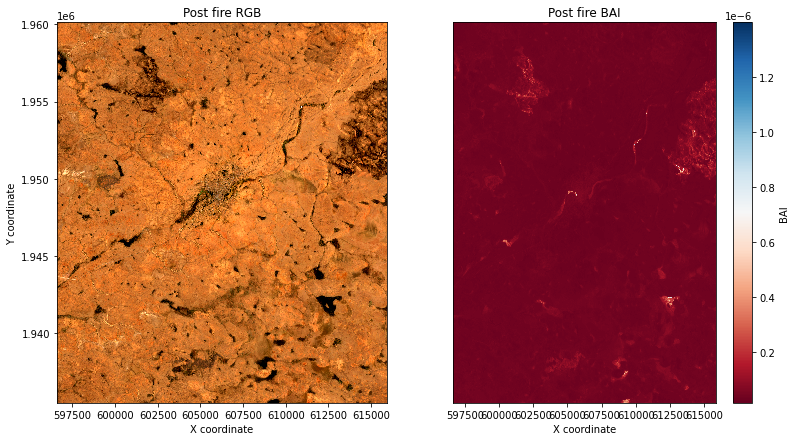

In [23]:
# Set up subplots.
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise the post-fire image as true colour image.
rgb(post_image, bands=["red", "green", "blue"], ax=ax1)
ax1.set_title("Post fire RGB")
ax1.set_xlabel("X coordinate")
ax1.set_ylabel("Y coordinate")

# Visualise post-fire image as BAI image.
post_BAI.plot(cmap="RdBu", ax=ax2)
ax2.set_title("Post fire BAI")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate")

plt.show()

## Generate Burnt Area Index for Sentinel 2 for the post fire period

In [24]:
# Calculate BAIS2 on all post-fire images.
post_combined["BAIS2"] = 1 - (
    (post_combined.red_edge_2 * post_combined.red_edge_3 * post_combined.nir_narrow)
    / post_combined.red
) ** 0.5 * (
    (
        (post_combined.swir_2 - post_combined.nir_narrow)
        / (post_combined.swir_2 + post_combined.nir_narrow) ** 0.5
    )
    + 1
)

# Calculate the median post-fire image.
post_image = post_combined.median(dim="time")

# Select BAIS2.
post_BAIS2 = post_image.BAIS2

### Visualise BAIS2

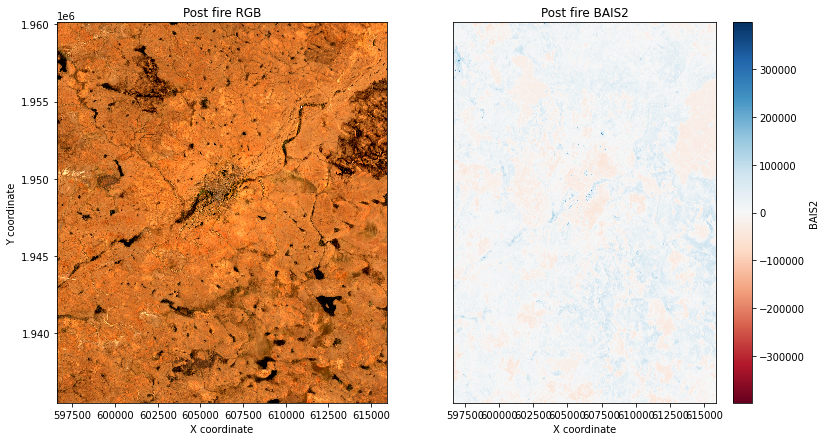

In [25]:
# Set up subplots.
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise the post-fire image as true colour image.
rgb(post_image, bands=["red", "green", "blue"], ax=ax1)
ax1.set_title("Post fire RGB")
ax1.set_xlabel("X coordinate")
ax1.set_ylabel("Y coordinate")

# Visualise post-fire image as BAIS2 image.
post_BAIS2.plot(cmap="RdBu", ax=ax2)
ax2.set_title("Post fire BAIS2")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate")

plt.show()

## MODIS and VIIRS hotspot data

The Fire information for Resource Management System ([FIRMS](https://firms.modaps.eosdis.nasa.gov/)) distributes hotspots observed from satellites for near real time (NRT) active fires and historical fires. 
The hotspot information is generated from both the Moderate Resolution Imaging Spectroradiometer (MODIS) and the Visible Infrared Imaging Radiometer Suite (VIIRS).

Here, the hotspots data from FIRMS is used to analyse the changes in NBR at the locations identified as active (or historical) fire. 
To obtain the data from FIRMS, a new request can be created on the [Archive Download](https://firms.modaps.eosdis.nasa.gov/download/) webpage. 
It is possible to specify the region and dates of interest for the hotspots information. 
Once the processing of request has been completed, shapefiles containing data from MODIS C6 and VIIRS will be available for download. 
The hotspots files for MODIS and VIIRS are processed separately.

As the region used for requesting hotspots can be different from the region used to process Sentinel-2 data, following two steps can be done either offline or within the notebook. 
The aforementioned two pre-processing steps are:

* Clip hotspots data for (`lon_range, lat_range`)
* Merge hotspot information from MODIS and VIIRS

After clipping and merging the hotspots information, open the hotspots shapefile using the next cell:

In [26]:
# Extract contents of zip file.

with ZipFile(
    "../../Supplementary_data/Burnt_area_mapping/fire_hotspots_Abalak.zip"
) as spots:
    spots.extractall(path="../../Supplementary_data/Burnt_area_mapping")

The next cell projects hotspots from the source projection (`"EPSG:4326"`) to the projection we're using for Sentinel-2 data (`EPSG:6933`). 
Here, we have used proj4 to transform hotspot locations from source to a desired projection.

In [27]:
# Read shapefile into a geopandas GeoDataFrame.
fire_hotspots = gpd.read_file(
    "../../Supplementary_data/Burnt_area_mapping/fire_hotspots_Abalak/fire_hotspots_Abalak.shp"
)

# Extract the location of hotspots from the GeoDataFrame into a numpy.ndarray.
spot_locs = fire_hotspots.to_crs(epsg=6933)
spot_locs = np.array([[item.x, item.y] for item in spot_locs.geometry.to_list()])

### Examine hotspots 

The next cells plot the FIRMS hotspots on top of the post-fire index images , and plots the baseline index images alongside. 
This allows for direct comparison of the index values before and after the fire, as well as how hotspots spatially correlate with areas that register as burnt after the fire.
Hotspots are shown as black squares in the second image.

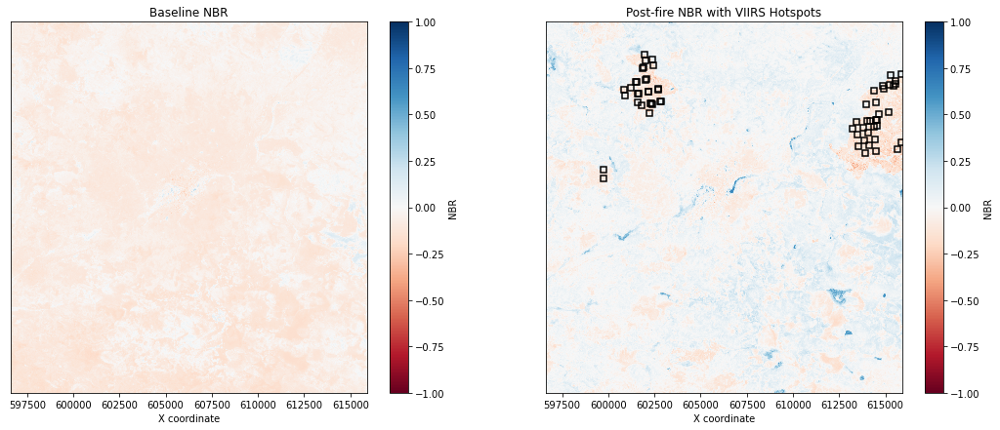

In [28]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 7))

# Visualise baseline image as NBR image.
baseline_NBR.plot(cmap="RdBu", vmin=-1, vmax=1, ax=ax1)
ax1.set_title("Baseline NBR")
ax1.yaxis.set_visible(False)
ax1.set_xlabel("X coordinate")

# Visualise post-fire image as NBR image and overplot hotspots.
post_NBR.plot(cmap="RdBu", vmin=-1, vmax=1, ax=ax2)
ax2.plot(
    spot_locs[:, 0],
    spot_locs[:, 1],
    marker="s",
    linestyle="",
    mfc="None",
    mec="k",
    mew=1.5,
)
ax2.set_title("Post-fire NBR with VIIRS Hotspots")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate");

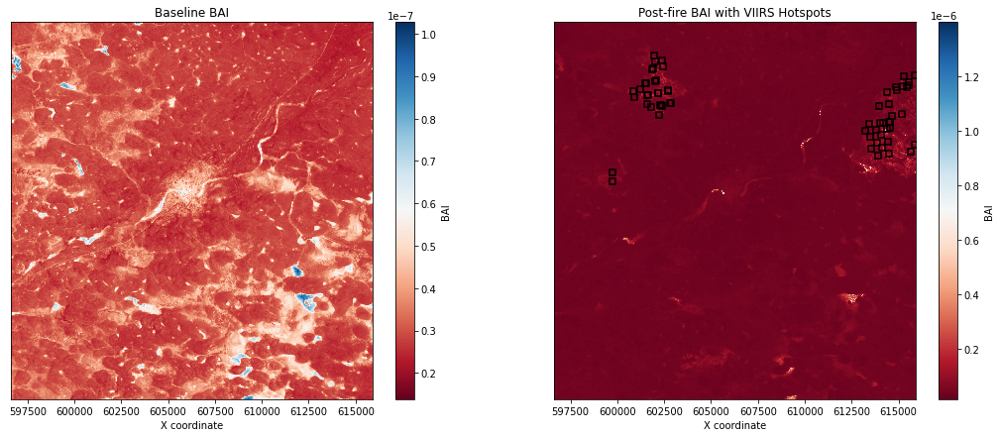

In [29]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 7))

# Visualise baseline image as BAI image.
baseline_BAI.plot(cmap="RdBu", ax=ax1)
ax1.set_title("Baseline BAI")
ax1.yaxis.set_visible(False)
ax1.set_xlabel("X coordinate")

# Visualise post-fire image as BAI image and overplot hotspots.
post_BAI.plot(cmap="RdBu", ax=ax2)
ax2.plot(
    spot_locs[:, 0],
    spot_locs[:, 1],
    marker="s",
    linestyle="",
    mfc="None",
    mec="k",
    mew=1.5,
)
ax2.set_title("Post-fire BAI with VIIRS Hotspots")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate");

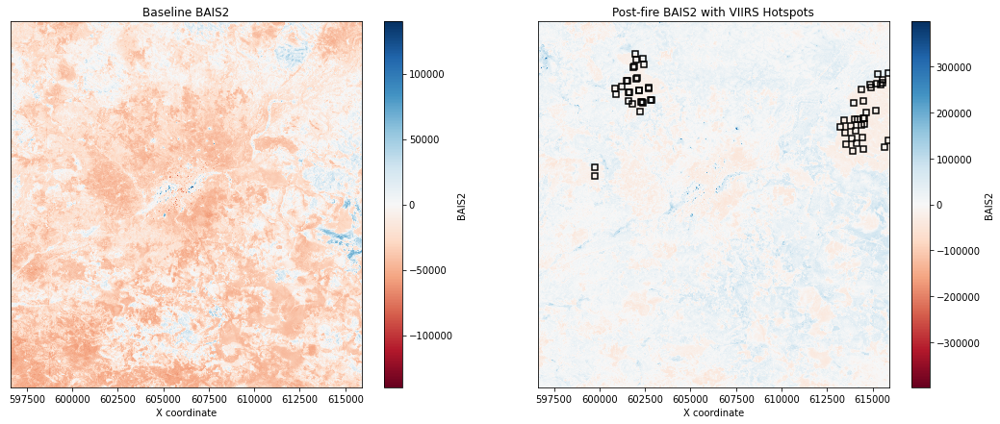

In [30]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 7))

# Visualise baseline image as BAIS2 image.
baseline_BAIS2.plot(cmap="RdBu", ax=ax1)
ax1.set_title("Baseline BAIS2")
ax1.yaxis.set_visible(False)
ax1.set_xlabel("X coordinate")

# Visualise post-fire image as BAIS2 image and overplot hotspots.
post_BAIS2.plot(cmap="RdBu", ax=ax2)
ax2.plot(
    spot_locs[:, 0],
    spot_locs[:, 1],
    marker="s",
    linestyle="",
    mfc="None",
    mec="k",
    mew=1.5,
)
ax2.set_title("Post-fire BAIS2 with VIIRS Hotspots")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate");

### Extract data at the FIRMS hotspots for the baseline and post-fire spectral indices

The next step is to extract the index values at the hotspot locations; doing this for the baseline and post-fire images allows us to examine how the fire has influenced the index values.

To extract data, we use the `xarray.DataArray.sel` method, which returns a two dimensional array. 
This in artefact of how we specified the coordinates of the hotspot locations, which are one dimensional numpy array.
The values along the diagonal of the returned two dimensional array correspond to the hotspot locations which can be obtained using `np.diagonal` method.

In [31]:
point_nbr = {}

# Extract baseline NBR at hotspot locations.
point_nbr["baseline"] = np.diagonal(
    baseline_NBR.sel(x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest")
)

# Extract post-fire NBR at hotspot locations.
point_nbr["post"] = np.diagonal(
    post_NBR.sel(x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest")
)

In [32]:
point_bai = {}

# Extract baseline BAI at hotspot locations.
point_bai["baseline"] = np.diagonal(
    baseline_BAI.sel(x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest")
)

# Extract post-fire BAI at hotspot locations.
point_bai["post"] = np.diagonal(
    post_BAI.sel(x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest")
)

In [33]:
point_bais2 = {}

# Extract baseline BAIS2 at hotspot locations
point_bais2["baseline"] = np.diagonal(
    baseline_BAIS2.sel(x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest")
)

# Extract post-fire BAIS2 at hotspot locations
point_bais2["post"] = np.diagonal(
    post_BAIS2.sel(x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest")
)

Using the extracted data, we can make a box-plot of each index obtained from baseline and post-fire datasets for all the hotspot locations.

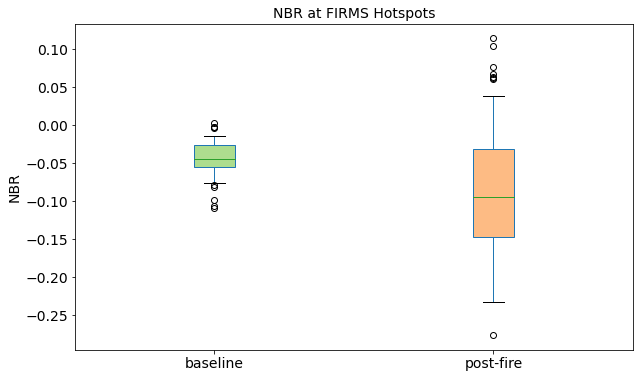

In [34]:
ax = pd.DataFrame(point_nbr).boxplot(
    figsize=(10, 6),
    whis=0.75,
    patch_artist=True,
    vert=True,
    fontsize=14,
    return_type="both",
)

ax[0].set_ylabel("NBR", fontsize=14)
ax[0].set_title("NBR at FIRMS Hotspots", fontsize=14)
ax[0].set_xticklabels(["baseline", "post-fire"])
ax[0].grid(False)

colors = ["#addd8e", "#fdbb84"]

for patch, color in zip(ax[1]["boxes"], colors):
    patch.set_facecolor(color)

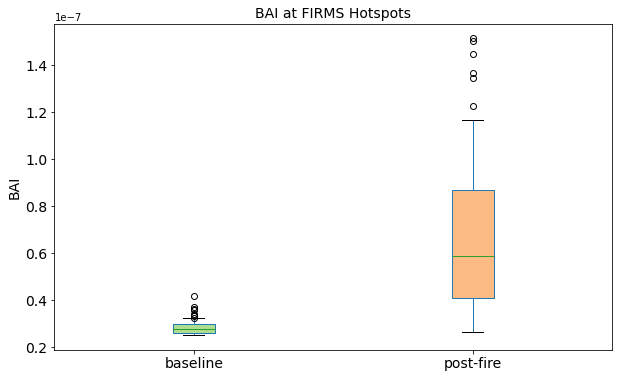

In [35]:
ax = pd.DataFrame(point_bai).boxplot(
    figsize=(10, 6),
    whis=0.75,
    patch_artist=True,
    vert=True,
    fontsize=14,
    return_type="both",
)

ax[0].set_ylabel("BAI", fontsize=14)
ax[0].set_title("BAI at FIRMS Hotspots", fontsize=14)
ax[0].set_xticklabels(["baseline", "post-fire"])
ax[0].grid(False)

colors = ["#addd8e", "#fdbb84"]

for patch, color in zip(ax[1]["boxes"], colors):
    patch.set_facecolor(color)

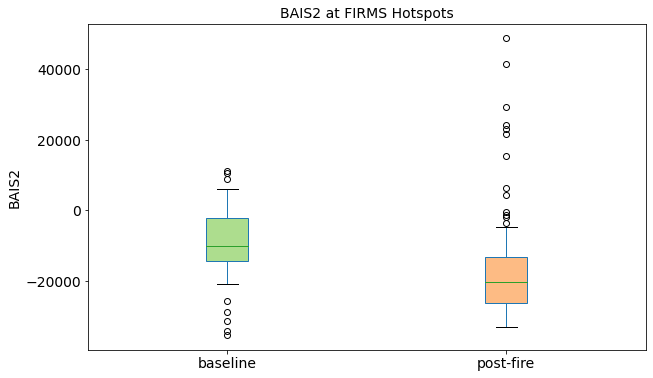

In [36]:
ax = pd.DataFrame(point_bais2).boxplot(
    figsize=(10, 6),
    whis=0.75,
    patch_artist=True,
    vert=True,
    fontsize=14,
    return_type="both",
)

ax[0].set_ylabel("BAIS2", fontsize=14)
ax[0].set_title("BAIS2 at FIRMS Hotspots", fontsize=14)
ax[0].set_xticklabels(["baseline", "post-fire"])
ax[0].grid(False)

colors = ["#addd8e", "#fdbb84"]

for patch, color in zip(ax[1]["boxes"], colors):
    patch.set_facecolor(color)

Here, we can notice that the post-fire NBR and BAIS2 decrease from the baseline NBR and BAIS2 at the hotspots, consistent with those locations having been affected by the fire. 
There is an increase from the post-fire BAI increases from the baseline BAI at the hotspots. 

We can also compare the change in NBR, BAI and BAIS2 over the course of the baseline three months at the hotspots. 
To that end, we will use `xarray` method to extract the data the hotspot locations.
To do this, we also extact cleaned versions of the dates of the baseline observations.

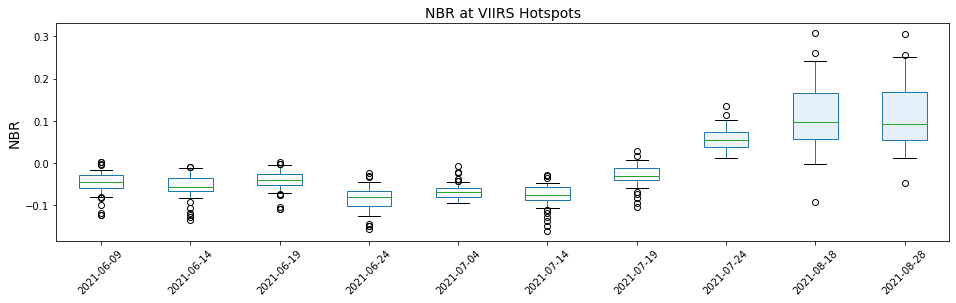

In [37]:
# Get cleaned baseline observation dates.
baseline_ard["time"] = baseline_ard.indexes["time"].normalize()
dates = (pd.to_datetime((baseline_ard.time).values)).strftime("%Y-%m-%d")

# Get the baseline NBR value for each image at all hotspots.
baseline_nbr_spot = baseline_ard.NBR.sel(
    x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest"
)

nbr_over_time = {}
for i in range(len(dates)):
    nbr_over_time[dates[i]] = np.diagonal(baseline_nbr_spot[i, :, :])
nbr_over_time = pd.DataFrame(nbr_over_time)

# Create a box plot for each observation.
ax = nbr_over_time.boxplot(
    figsize=(16, 4), whis=0.75, patch_artist=True, vert=True, return_type="both"
)
ax[0].set_ylabel("NBR", fontsize=14)
ax[0].set_title("NBR at VIIRS Hotspots", fontsize=14)
ax[0].grid(False)

# Colour the boxes by the mean NBR of each observation.
cm = plt.cm.get_cmap("Blues", len(nbr_over_time.index))
colors = [cm(item.get_ydata().mean()) for item in ax[1]["medians"]]
for patch, color in zip(ax[1]["boxes"], colors):
    patch.set_facecolor(color)
ax[0].tick_params(axis="x", rotation=45)

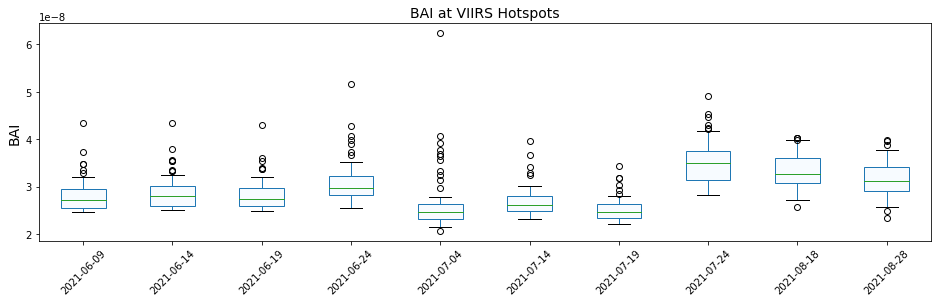

In [38]:
# Get the baseline BAI value for each image at all hotspots.
baseline_bai_spot = baseline_ard.BAI.sel(
    x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest"
)

bai_over_time = {}
for i in range(len(dates)):
    bai_over_time[dates[i]] = np.diagonal(baseline_bai_spot[i, :, :])
bai_over_time = pd.DataFrame(bai_over_time)

# Create a box plot for each observation.
ax = bai_over_time.boxplot(
    figsize=(16, 4), whis=0.75, patch_artist=True, vert=True, return_type="both"
)
ax[0].set_ylabel("BAI", fontsize=14)
ax[0].set_title("BAI at VIIRS Hotspots", fontsize=14)
ax[0].grid(False)

# Colour the boxes by the mean BAI of each observation.
cm = plt.cm.get_cmap("Blues", len(bai_over_time.index))
colors = [cm(item.get_ydata().mean()) for item in ax[1]["medians"]]
for patch, color in zip(ax[1]["boxes"], colors):
    patch.set_facecolor(color)
ax[0].tick_params(axis="x", rotation=45)

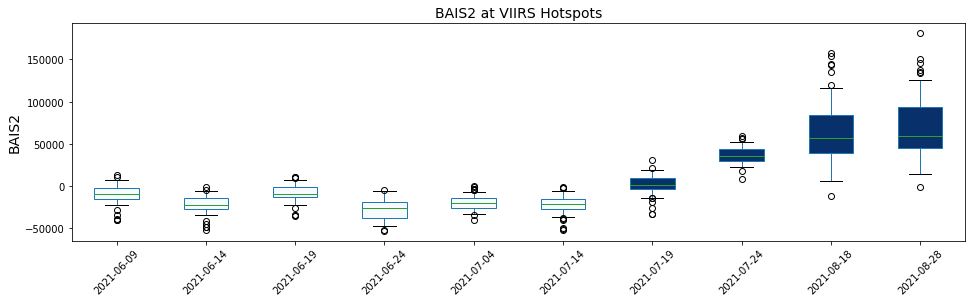

In [39]:
# Get the baseline BAIS2 value for each image at all hotspots.
baseline_bais2_spot = baseline_ard.BAIS2.sel(
    x=spot_locs[:, 0], y=spot_locs[:, 1], method="nearest"
)

bais2_over_time = {}
for i in range(len(dates)):
    bais2_over_time[dates[i]] = np.diagonal(baseline_bais2_spot[i, :, :])
bais2_over_time = pd.DataFrame(bais2_over_time)

# Create a box plot for each observation.
ax = bais2_over_time.boxplot(
    figsize=(16, 4), whis=0.75, patch_artist=True, vert=True, return_type="both"
)
ax[0].set_ylabel("BAIS2", fontsize=14)
ax[0].set_title("BAIS2 at VIIRS Hotspots", fontsize=14)
ax[0].grid(False)

# Colour the boxes by the mean BAIS2 of each observation.
cm = plt.cm.get_cmap("Blues", len(bais2_over_time.index))
colors = [cm(item.get_ydata().mean()) for item in ax[1]["medians"]]
for patch, color in zip(ax[1]["boxes"], colors):
    patch.set_facecolor(color)
ax[0].tick_params(axis="x", rotation=45)

After plotting the change in NBR and BAIS2 over the baseline period of three months, we can notice that there is sharp increase in NBR, BAI and BAIS2 between 19th July 2021 and 24th July 2021, however, there is little to no change between 9th June 2021 and 14th July 2021.

Finally, we plot the post-fire data for the 3 spectral indices side-by-side with an RGB plot of the study area:

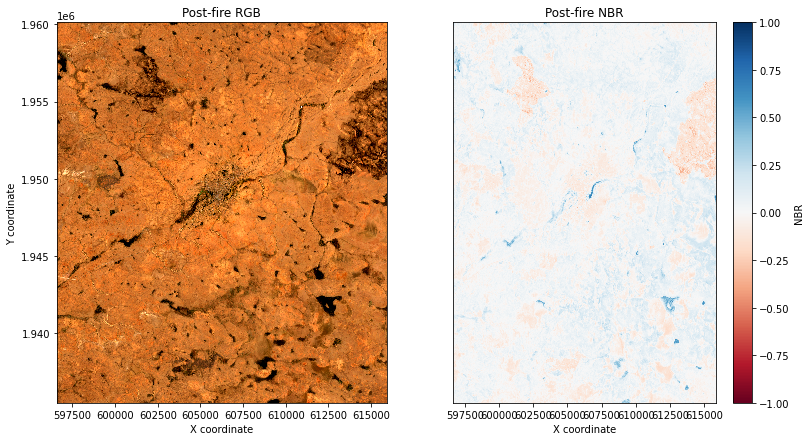

In [40]:
# Set up subplots.
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise post-fire image as true colour image.
rgb(post_image, bands=["red", "green", "blue"], ax=ax1)
ax1.set_title("Post-fire RGB")
ax1.set_xlabel("X coordinate")
ax1.set_ylabel("Y coordinate")

# Visualise post-fire image as NBR image.
post_NBR.plot(cmap="RdBu", vmin=-1, vmax=1, ax=ax2)
ax2.set_title("Post-fire NBR")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate")

plt.show()

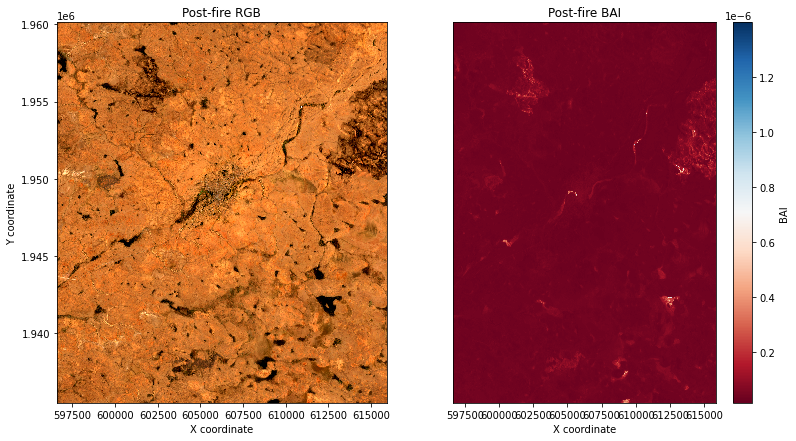

In [41]:
# Set up subplots
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise post-fire image as true colour image
rgb(post_image, 
    bands=['red', 'green', 'blue'], 
    ax=ax1)
ax1.set_title('Post-fire RGB')
ax1.set_xlabel('X coordinate')
ax1.set_ylabel('Y coordinate')

# Visualise post-fire image as BAI image
post_BAI.plot(cmap='RdBu', ax=ax2)
ax2.set_title('Post-fire BAI')
ax2.yaxis.set_visible(False)
ax2.set_xlabel('X coordinate')

plt.show()

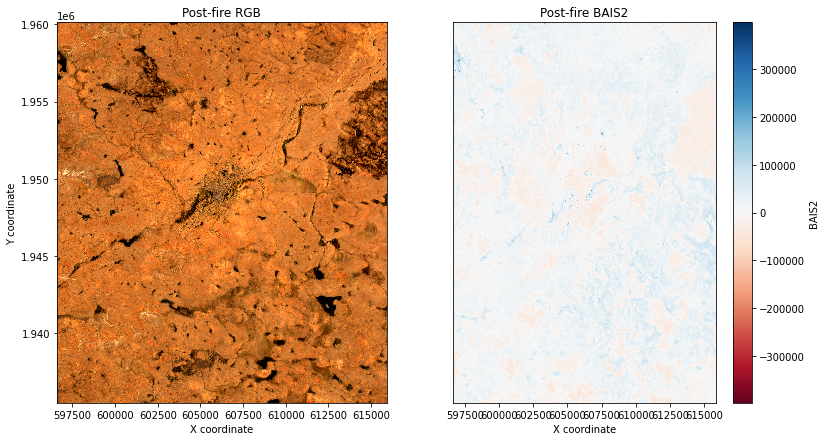

In [42]:
# Set up subplots
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 7))

# Visualise post-fire image as true colour image
rgb(post_image, bands=["red", "green", "blue"], ax=ax1)
ax1.set_title("Post-fire RGB")
ax1.set_xlabel("X coordinate")
ax1.set_ylabel("Y coordinate")

# Visualise post-fire image as BAIS2 image
post_BAIS2.plot(cmap="RdBu", ax=ax2)
ax2.set_title("Post-fire BAIS2")
ax2.yaxis.set_visible(False)
ax2.set_xlabel("X coordinate")

plt.show()

## Calculate Delta Normalized Burn Ratio, Delta BAI and Delta BAIS2
We can now compute the change for each spectral index, NBR, BAI and BAIS2 by subtracting our post-fire data from our baseline data for each index:

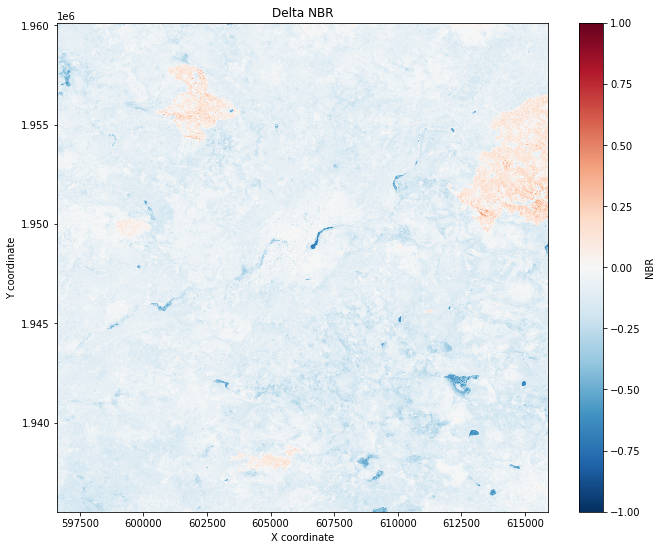

In [43]:
delta_NBR = baseline_NBR - post_NBR

# Visualise dNBR image.
delta_NBR.plot(cmap="RdBu_r", vmin=-1, vmax=1, figsize=(11, 9))
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.title("Delta NBR")

plt.show()

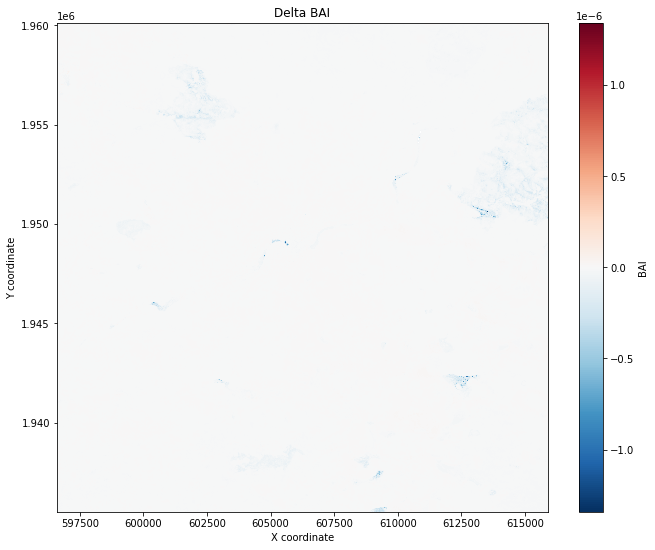

In [44]:
delta_BAI = baseline_BAI - post_BAI

# Visualise dBAI image.
delta_BAI.plot(cmap="RdBu_r", figsize=(11, 9))
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.title("Delta BAI")

plt.show()

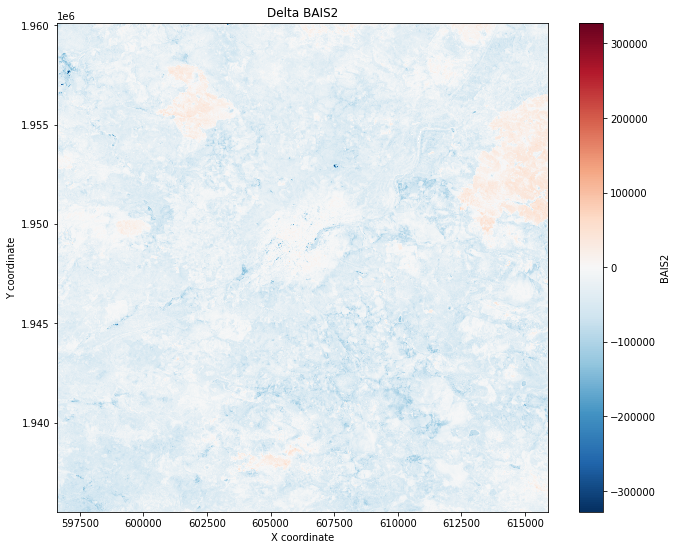

In [45]:
delta_BAIS2 = baseline_BAIS2 - post_BAIS2

# Visualise dBAIS2 image.
delta_BAIS2.plot(cmap="RdBu_r", figsize=(11, 9))
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.title("Delta BAIS2")

plt.show()

## Apply threshold to Delta Normalized Burn Ratio

We now apply the dNBR threshold value to try and reduce false positives, only keeping areas with dNBR values greater than the chosen threshold value of 0.1.
The chosen threshold value may need to be adjusted depending on the use case.

In [46]:
# Set threshold.
threshold_NBR = 0.1

# Apply threshold.
burnt_NBR = delta_NBR > threshold_NBR

# Mask post-fire true colour image.
masked_NBR = delta_NBR.where(burnt_NBR == 1)

Re-visualize pre and post-fire true colour images to help adjust the NBR threshold:

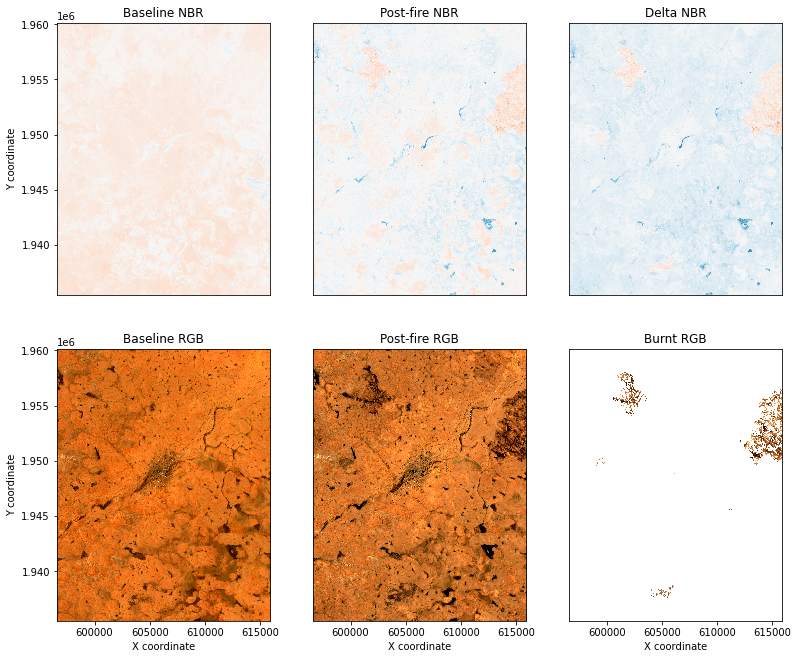

In [47]:
# Set up subplots.
f, axarr = plt.subplots(2, 3, figsize=(13, 11))
bands = ["red", "green", "blue"]

baseline_NBR.plot(cmap="RdBu", vmin=-1, vmax=1, add_colorbar=False, ax=axarr[0, 0])
axarr[0, 0].set_title("Baseline NBR")
axarr[0, 0].set_ylabel("Y coordinate")
axarr[0, 0].xaxis.set_visible(False)

post_NBR.plot(cmap="RdBu", vmin=-1, vmax=1, add_colorbar=False, ax=axarr[0, 1])
axarr[0, 1].set_title("Post-fire NBR")
axarr[0, 1].yaxis.set_visible(False)
axarr[0, 1].xaxis.set_visible(False)

delta_NBR.plot(cmap="RdBu_r", vmin=-1, vmax=1, add_colorbar=False, ax=axarr[0, 2])
axarr[0, 2].set_title("Delta NBR")
axarr[0, 2].yaxis.set_visible(False)
axarr[0, 2].xaxis.set_visible(False)

rgb(baseline_image, bands=bands, ax=axarr[1, 0])
axarr[1, 0].set_title("Baseline RGB")
axarr[1, 0].set_title("Baseline RGB")
axarr[1, 0].set_xlabel("X coordinate")
axarr[1, 0].set_ylabel("Y coordinate")

rgb(post_image, bands=bands, ax=axarr[1, 1])
axarr[1, 1].set_title("Post-fire RGB")
axarr[1, 1].set_xlabel("X coordinate")
axarr[1, 1].yaxis.set_visible(False)

rgb(post_image.where(burnt_NBR == 1), bands=bands, ax=axarr[1, 2])
axarr[1, 2].set_title("Burnt RGB")
axarr[1, 2].set_xlabel("X coordinate")
axarr[1, 2].yaxis.set_visible(False)

## Apply threshold to Delta Burnt Area Index 

In [48]:
# Set threshold.
threshold_BAI = -0.00000005

# Apply threshold.
burnt_BAI = delta_BAI < threshold_BAI

# Mask post-fire true colour image.
masked_BAI = delta_BAI.where(burnt_BAI == 1)

Re-visualize pre and post-fire true colour images to help adjust the BAI threshold:

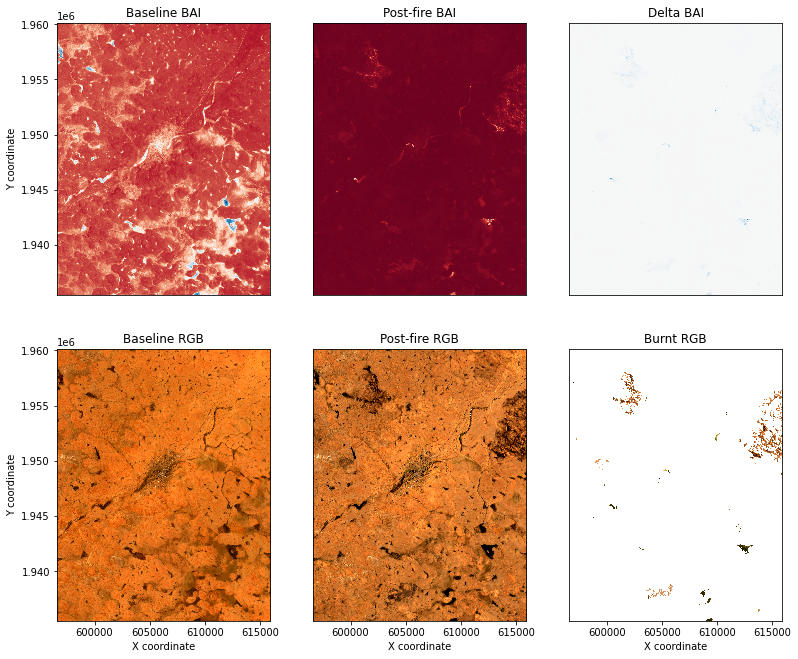

In [49]:
# Set up subplots.
f, axarr = plt.subplots(2, 3, figsize=(13, 11))
bands = ["red", "green", "blue"]

baseline_BAI.plot(cmap="RdBu", add_colorbar=False, ax=axarr[0, 0])
axarr[0, 0].set_title("Baseline BAI")
axarr[0, 0].set_ylabel("Y coordinate")
axarr[0, 0].xaxis.set_visible(False)

post_BAI.plot(cmap="RdBu", add_colorbar=False, ax=axarr[0, 1])
axarr[0, 1].set_title("Post-fire BAI")
axarr[0, 1].yaxis.set_visible(False)
axarr[0, 1].xaxis.set_visible(False)

delta_BAI.plot(cmap="RdBu_r", add_colorbar=False, ax=axarr[0, 2])
axarr[0, 2].set_title("Delta BAI")
axarr[0, 2].yaxis.set_visible(False)
axarr[0, 2].xaxis.set_visible(False)

rgb(baseline_image, bands=bands, ax=axarr[1, 0])
axarr[1, 0].set_title("Baseline RGB")
axarr[1, 0].set_title("Baseline RGB")
axarr[1, 0].set_xlabel("X coordinate")
axarr[1, 0].set_ylabel("Y coordinate")

rgb(post_image, bands=bands, ax=axarr[1, 1])
axarr[1, 1].set_title("Post-fire RGB")
axarr[1, 1].set_xlabel("X coordinate")
axarr[1, 1].yaxis.set_visible(False)

rgb(post_image.where(burnt_BAI == 1), bands=bands, ax=axarr[1, 2])
axarr[1, 2].set_title("Burnt RGB")
axarr[1, 2].set_xlabel("X coordinate")
axarr[1, 2].yaxis.set_visible(False)

## Apply threshold to Delta Burnt Area Index for Sentinel 2 

In [50]:
# Set threshold.
threshold_BAIS2 = 20000

# Apply threshold.
burnt_BAIS2 = delta_BAIS2 > threshold_BAIS2

# Mask post-fire true colour image.
masked_BAIS2 = delta_BAIS2.where(burnt_BAIS2 == 1)

Re-visualize pre and post-fire true colour images to help adjust the BAIS2 threshold:

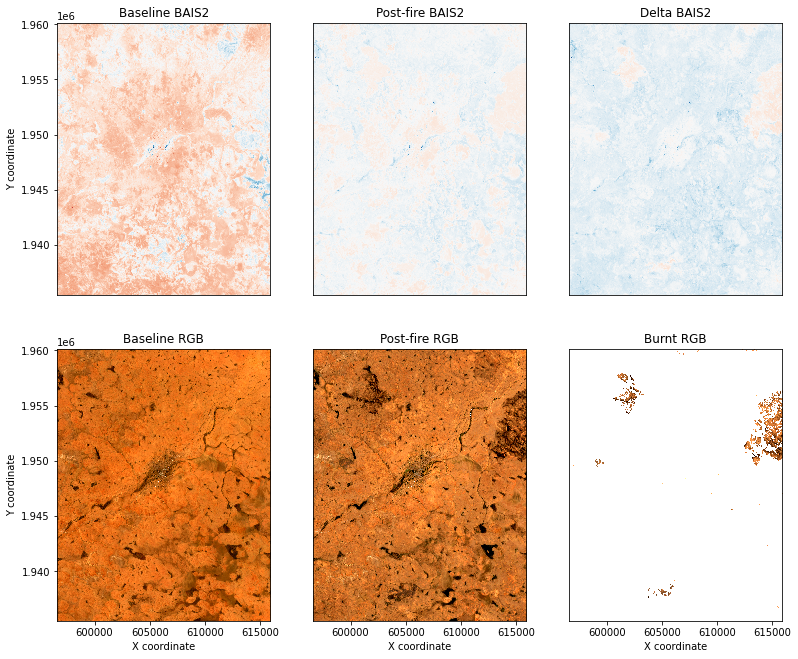

In [51]:
# Set up subplots.
f, axarr = plt.subplots(2, 3, figsize=(13, 11))
bands = ["red", "green", "blue"]

baseline_BAIS2.plot(cmap="RdBu", add_colorbar=False, ax=axarr[0, 0])
axarr[0, 0].set_title("Baseline BAIS2")
axarr[0, 0].set_ylabel("Y coordinate")
axarr[0, 0].xaxis.set_visible(False)

post_BAIS2.plot(cmap="RdBu", add_colorbar=False, ax=axarr[0, 1])
axarr[0, 1].set_title("Post-fire BAIS2")
axarr[0, 1].yaxis.set_visible(False)
axarr[0, 1].xaxis.set_visible(False)

delta_BAIS2.plot(cmap="RdBu_r", add_colorbar=False, ax=axarr[0, 2])
axarr[0, 2].set_title("Delta BAIS2")
axarr[0, 2].yaxis.set_visible(False)
axarr[0, 2].xaxis.set_visible(False)

rgb(baseline_image, bands=bands, ax=axarr[1, 0])
axarr[1, 0].set_title("Baseline RGB")
axarr[1, 0].set_title("Baseline RGB")
axarr[1, 0].set_xlabel("X coordinate")
axarr[1, 0].set_ylabel("Y coordinate")

rgb(post_image, bands=bands, ax=axarr[1, 1])
axarr[1, 1].set_title("Post-fire RGB")
axarr[1, 1].set_xlabel("X coordinate")
axarr[1, 1].yaxis.set_visible(False)

rgb(post_image.where(burnt_BAIS2 == 1), bands=bands, ax=axarr[1, 2])
axarr[1, 2].set_title("Burnt RGB")
axarr[1, 2].set_xlabel("X coordinate")
axarr[1, 2].yaxis.set_visible(False)

## Calculate the burnt area for each index

The next cell uses the resolution of Sentinel-2 pixels to estimate the amount of area burnt, defined as those areas with dNBR values greater than the set threshold.
A number of other statistics are calculated, accounting for areas that have no data.

In [52]:
# Constants for calculating burnt area.
pixel_length = resolution[1]  # in metres
m_per_km = 1000  # conversion from metres to kilometres

# Area per pixel.
area_per_pixel = pixel_length ** 2 / m_per_km ** 2

# Calculate areas.
unburnt_area = (delta_NBR <= threshold_NBR).sum() * area_per_pixel
burnt_area = burnt_NBR.sum() * area_per_pixel
not_nan_area = delta_NBR.notnull().sum() * area_per_pixel
nan_area = delta_NBR.isnull().sum() * area_per_pixel
total_area = unburnt_area + burnt_area + nan_area

sq = "\u00b2"
print(f"Unburnt area:            {unburnt_area.item():.2f} km{sq}")
print(f"Burnt area:              {burnt_area.item():.2f} km{sq}")
print(f"Nan area:                {nan_area.item():.2f} km{sq}")
print(f"Total area (no nans):    {not_nan_area.item():.2f} km{sq}")
print(f"Total area (with nans):  {total_area.item():.2f} km{sq}")
print()
print(f"Percentage of total area burnt: {100*burnt_area.item()/total_area.item():.2f}%")

Unburnt area:            465.07 km²
Burnt area:              10.33 km²
Nan area:                0.01 km²
Total area (no nans):    475.41 km²
Total area (with nans):  475.41 km²

Percentage of total area burnt: 2.17%


In [53]:
# Constants for calculating burnt area.
pixel_length = resolution[1]  # in metres
m_per_km = 1000  # conversion from metres to kilometres

# Area per pixel.
area_per_pixel = pixel_length ** 2 / m_per_km ** 2

# Calculate areas.
unburnt_area = (delta_BAI >= threshold_BAI).sum() * area_per_pixel
burnt_area = burnt_BAI.sum() * area_per_pixel
not_nan_area = delta_BAI.notnull().sum() * area_per_pixel
nan_area = delta_BAI.isnull().sum() * area_per_pixel
total_area = unburnt_area + burnt_area + nan_area

print(f"Unburnt area:            {unburnt_area.item():.2f} km^2")
print(f"Burnt area:              {burnt_area.item():.2f} km^2")
print(f"Nan area:                {nan_area.item():.2f} km^2")
print(f"Total area (no nans):    {not_nan_area.item():.2f} km^2")
print(f"Total area (with nans):  {total_area.item():.2f} km^2")
print()
print(f"Percentage of total area burnt: {100*burnt_area.item()/total_area.item():.2f}%")

Unburnt area:            466.19 km^2
Burnt area:              9.21 km^2
Nan area:                0.01 km^2
Total area (no nans):    475.41 km^2
Total area (with nans):  475.41 km^2

Percentage of total area burnt: 1.94%


In [54]:
# Constants for calculating burnt area.
pixel_length = resolution[1]  # in metres
m_per_km = 1000  # conversion from metres to kilometres

# Area per pixel.
area_per_pixel = pixel_length ** 2 / m_per_km ** 2

# Calculate areas.
unburnt_area = (delta_BAIS2 <= threshold_BAIS2).sum() * area_per_pixel
burnt_area = burnt_BAIS2.sum() * area_per_pixel
not_nan_area = delta_BAIS2.notnull().sum() * area_per_pixel
nan_area = delta_BAIS2.isnull().sum() * area_per_pixel
total_area = unburnt_area + burnt_area + nan_area

print(f"Unburnt area:            {unburnt_area.item():.2f} km^2")
print(f"Burnt area:              {burnt_area.item():.2f} km^2")
print(f"Nan area:                {nan_area.item():.2f} km^2")
print(f"Total area (no nans):    {not_nan_area.item():.2f} km^2")
print(f"Total area (with nans):  {total_area.item():.2f} km^2")
print()
print(f"Percentage of total area burnt: {100*burnt_area.item()/total_area.item():.2f}%")

Unburnt area:            464.40 km^2
Burnt area:              11.00 km^2
Nan area:                0.01 km^2
Total area (no nans):    475.41 km^2
Total area (with nans):  475.41 km^2

Percentage of total area burnt: 2.31%


## Export results to GeoTIFF

The baseline reference image and the post fire image will both be saved as a multiband GeoTIFF with the following bands in the following order: Blue, Green, Red, NIR, SWIR. 

The thresholded burnt area image for the NBR, BAI and BAIS2 spectral indices will each be saved as a single band image, where a value of 1 = burnt and a value of 0 = not burnt.

In [ ]:
# Write baseline reference image to multi-band GeoTIFF.
write_cog(baseline_image.to_array(), f"{area_name}_baseline_image.tif", overwrite=True)

# Write post fire image to multi-band GeoTIFF.
write_cog(post_image.to_array(), f"{area_name}_post_fire_image.tif", overwrite=True)

# Turn delta NBR into a Xarray Dataset for export to GeoTIFF.
dnbr_dataset = delta_NBR.to_dataset(name="burnt_area")
write_cog(dnbr_dataset.to_array(), f"{area_name}_delta_NBR.tif", overwrite=True)

# Turn delta BAI into a Xarray Dataset for export to GeoTIFF.
dbai_dataset = delta_BAI.to_dataset(name="burnt_area")
write_cog(dbai_dataset.to_array(), f"{area_name}_delta_BAI.tif", overwrite=True)

# Turn delta BAIS2 into a Xarray Dataset for export to GeoTIFF.
dbais2_dataset = delta_BAIS2.to_dataset(name="burnt_area")
write_cog(dbais2_dataset.to_array(), f"{area_name}_delta_BAIS2.tif", overwrite=True)

---

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:**

In [ ]:
print(datacube.__version__)

**Last Tested:**

In [ ]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')